# Analyse the saliencies for C. Atrox

## Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import pandas as pd

import sys 
sys.path.append('../vespag')

from parse.vep_scores import get_vespag_scores
from src.plotting import *
from src.amino_acid_groups import AA_GROUPS
from src.constants import GEMME_ALPHABET
from src.utils import *

## Data Loading and Enrichment

Saliencies

In [3]:
saliency_map = np.load('../output_c_atrox/MF974418_1_Crotalus_atrox_saliency.npy')
# Dimension of saliency maps: (sequence length, mutations, embedding dimensions)
print(saliency_map.shape)

(122, 20, 2560)


In [4]:
# load the sequence from the fasta file 
fasta_path = '../data/MF974418_1_Crotalus_atrox.fasta'
with open(fasta_path) as f: 
    fasta = f.readlines()
    sequence = ''.join(fasta[1:]).replace('\n', '')
print(sequence)

SLVQFETLIMKIAGRSGLLWYSAYGCYCGWGGHGLPQDATDRCCFVHDCCYGKATDCNPKTVSYTYSEENGEIICGGDDPCGTQICECDKAAAICFRDNIPSYDNKYWLFPPKNCREEPEPC


In [5]:
# check that all elements in the third dimension (=gradients) are zero when the wildtype is equal to the mutant
all_zero = np.all(saliency_map == 0, axis=2)
zero_indices = np.argwhere(all_zero)

not_equal = 0
equal = 0   
for i, j in zero_indices:
    if sequence[i] != GEMME_ALPHABET[j]:
        not_equal += 1
    else:
        equal += 1
print(not_equal, equal)

0 122


VespaG

In [6]:
vespag_path = '/mnt/f/nicole/pla2_vespag/MF974418_1_Crotalus_atrox.csv'
vespag_scores = get_vespag_scores(vespag_path)
vespag_scores.head()

,residue,mutation,vespag
0,S1,S1A,-2.733914
1,S1,S1Y,-4.639794
2,S1,S1W,-4.962937
3,S1,S1V,-4.356812
4,S1,S1T,-2.385255


In [7]:
# invert the vespag score to get the mutation effect
vespag_scores['mutation_effect'] = - vespag_scores['vespag']
# extract residue_index 
vespag_scores['residue_index'] = vespag_scores['residue'].str[1:].astype(int)
# extract the wildtype residue
vespag_scores['wildtype'] = vespag_scores['residue'].str[0]
# extract the mutant residue
vespag_scores['mutant'] = vespag_scores['mutation'].str[-1]
# add the amino acid annotation for each wildtype
aa_groups = list(AA_GROUPS.keys())
for aa_group in aa_groups:
    vespag_scores[f'wildtype_{aa_group}'] = vespag_scores['wildtype'].apply(lambda x: AA_GROUPS[aa_group][x])
    vespag_scores[f'mutant_{aa_group}'] = vespag_scores['mutant'].apply(lambda x: AA_GROUPS[aa_group][x])
    vespag_scores[f'change_{aa_group}'] = vespag_scores[f'wildtype_{aa_group}'] != vespag_scores[f'mutant_{aa_group}']
vespag_scores.head()

,residue,mutation,vespag,mutation_effect,residue_index,wildtype,mutant,wildtype_hydropathy_classes,mutant_hydropathy_classes,change_hydropathy_classes,...,change_physicochemical_classes,wildtype_charge_classes,mutant_charge_classes,change_charge_classes,wildtype_polarity_classes,mutant_polarity_classes,change_polarity_classes,wildtype_hydrogen_donor_acceptor_classes,mutant_hydrogen_donor_acceptor_classes,change_hydrogen_donor_acceptor_classes
0,S1,S1A,-2.733914,2.733914,1,S,A,neutral,hydrophobic,True,...,True,uncharged,uncharged,False,polar,nonpolar,True,donor and acceptor,none,True
1,S1,S1Y,-4.639794,4.639794,1,S,Y,neutral,neutral,False,...,True,uncharged,uncharged,False,polar,polar,False,donor and acceptor,donor and acceptor,False
2,S1,S1W,-4.962937,4.962937,1,S,W,neutral,hydrophobic,True,...,True,uncharged,uncharged,False,polar,nonpolar,True,donor and acceptor,donor,True
3,S1,S1V,-4.356812,4.356812,1,S,V,neutral,hydrophobic,True,...,True,uncharged,uncharged,False,polar,nonpolar,True,donor and acceptor,none,True
4,S1,S1T,-2.385255,2.385255,1,S,T,neutral,neutral,False,...,False,uncharged,uncharged,False,polar,polar,False,donor and acceptor,donor and acceptor,False


In [8]:
# get the average saliency per residue and mutant 
average_saliency = np.mean(saliency_map, axis=2)
# parse this as a dataframe 
average_saliency_df = pd.DataFrame(average_saliency, columns=list(GEMME_ALPHABET))
# add the residue index
average_saliency_df['residue_index'] = np.arange(1, len(sequence)+1)
# tidy the dataframe into a dataframe with these columns: residue_index, mutant, avg_saliency 
average_saliency_df = average_saliency_df.melt(id_vars='residue_index', var_name='mutant', value_name='avg_saliency')
# order by residue index, wildtype
average_saliency_df = average_saliency_df.sort_values(['residue_index', 'mutant'])
average_saliency_df.head()

,residue_index,mutant,avg_saliency
0,1,A,0.053386
122,1,C,0.051690
244,1,D,0.054496
366,1,E,0.055532
488,1,F,0.064669


In [9]:
# merge the vespag scores with the average saliency
mutation_effect_avg_saliency = average_saliency_df.merge(vespag_scores, on=['residue_index', 'mutant'], how='inner')
mutation_effect_avg_saliency.head()

,residue_index,mutant,avg_saliency,residue,mutation,vespag,mutation_effect,wildtype,wildtype_hydropathy_classes,mutant_hydropathy_classes,...,change_physicochemical_classes,wildtype_charge_classes,mutant_charge_classes,change_charge_classes,wildtype_polarity_classes,mutant_polarity_classes,change_polarity_classes,wildtype_hydrogen_donor_acceptor_classes,mutant_hydrogen_donor_acceptor_classes,change_hydrogen_donor_acceptor_classes
0,1,A,0.053386,S1,S1A,-2.733914,2.733914,S,neutral,hydrophobic,...,True,uncharged,uncharged,False,polar,nonpolar,True,donor and acceptor,none,True
1,1,C,0.051690,S1,S1C,-3.132834,3.132834,S,neutral,hydrophobic,...,True,uncharged,uncharged,False,polar,nonpolar,True,donor and acceptor,none,True
2,1,D,0.054496,S1,S1D,-2.926506,2.926506,S,neutral,hydrophilic,...,True,uncharged,negative charged,True,polar,polar,False,donor and acceptor,acceptor,True
3,1,E,0.055532,S1,S1E,-3.226403,3.226403,S,neutral,hydrophilic,...,True,uncharged,negative charged,True,polar,polar,False,donor and acceptor,acceptor,True
4,1,F,0.064669,S1,S1F,-4.838263,4.838263,S,neutral,hydrophobic,...,True,uncharged,uncharged,False,polar,nonpolar,True,donor and acceptor,none,True


## Aggregation over the entire Sequence 

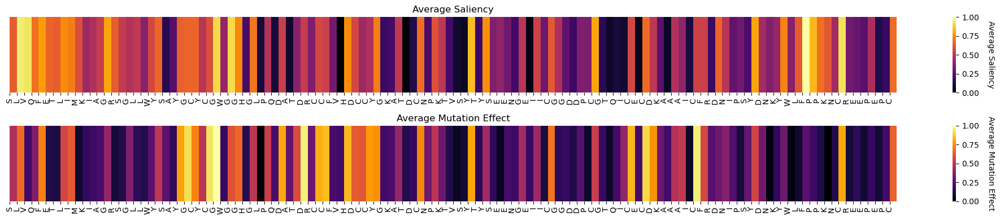

In [10]:
plot_mutation_saliency_over_sequence(mutation_effect_avg_saliency, sequence)

## Investigate H48

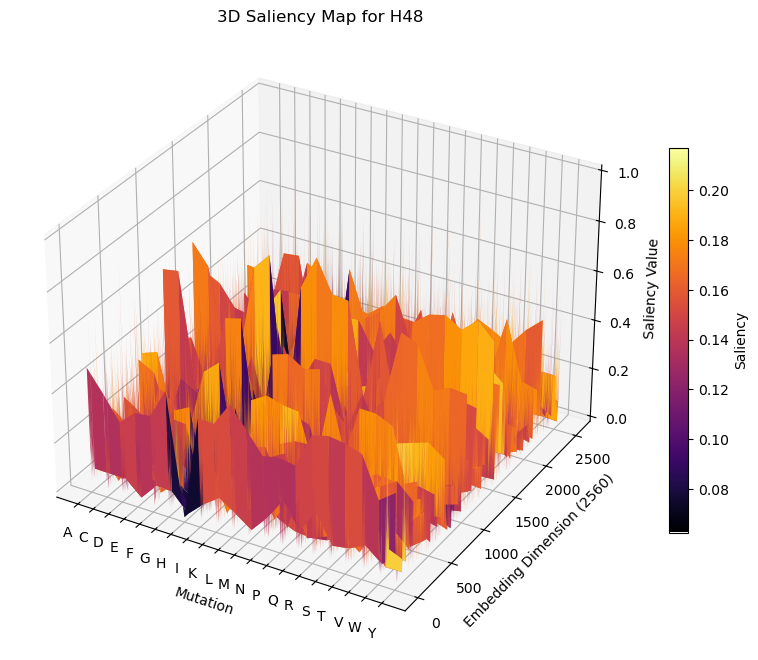

In [11]:
# out of curiosity: look into the saliency for H48 -> H47 due to common numbering scheme
residue_index_one_index = 47
residue_index_zero_index = residue_index_one_index - 1
assert saliency_map[residue_index_zero_index][GEMME_ALPHABET.index('H')].all() == 0
assert sequence[residue_index_zero_index] == 'H'
plot_residue_saliency_3d(saliency_map, residue_index_zero_index, title="3D Saliency Map for H48")

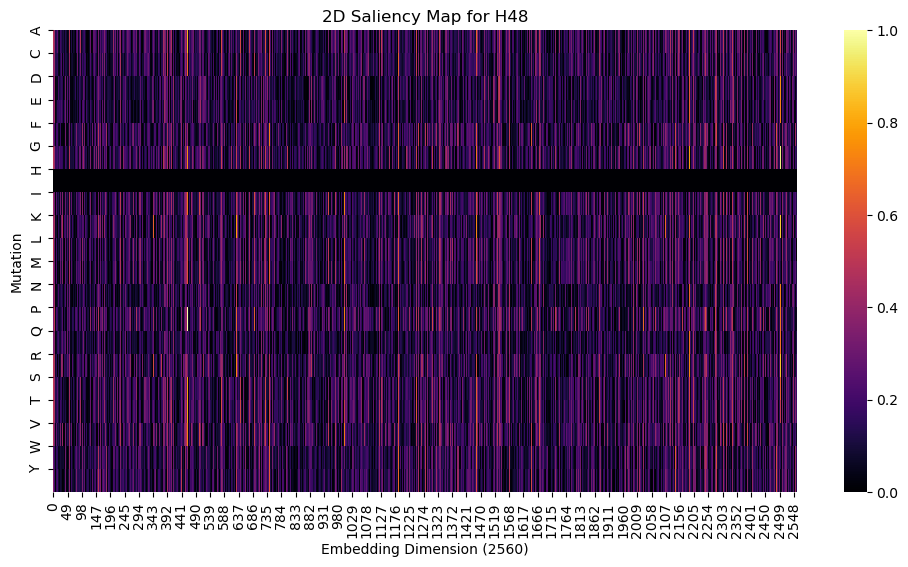

In [12]:
plot_residue_saliency_2d(saliency_map, residue_index_zero_index, title="2D Saliency Map for H48")

## Average Saliency of each Embedding Dimension

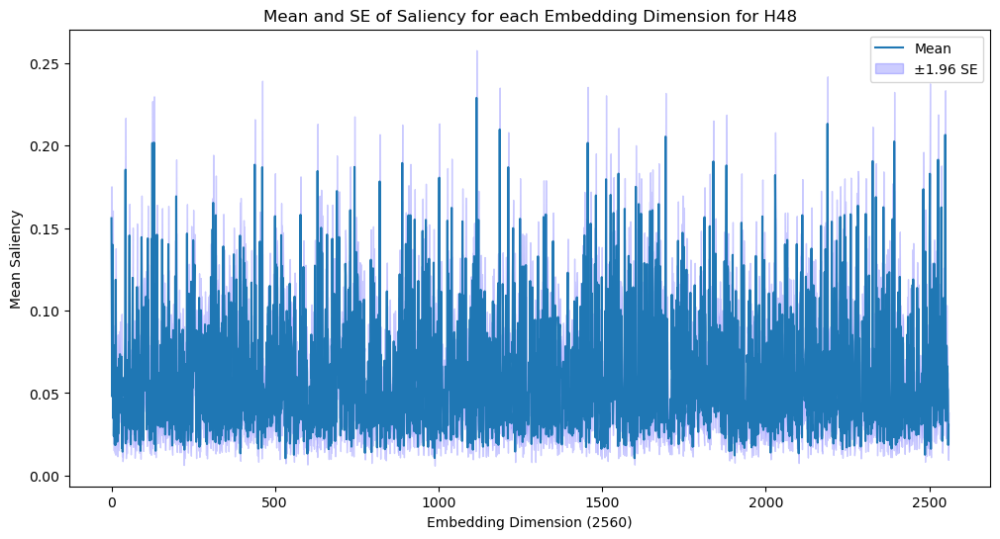

In [13]:
plot_mean_saliency_for_residue(saliency_map, residue_index_zero_index, title="Mean and SE of Saliency for each Embedding Dimension for H48")

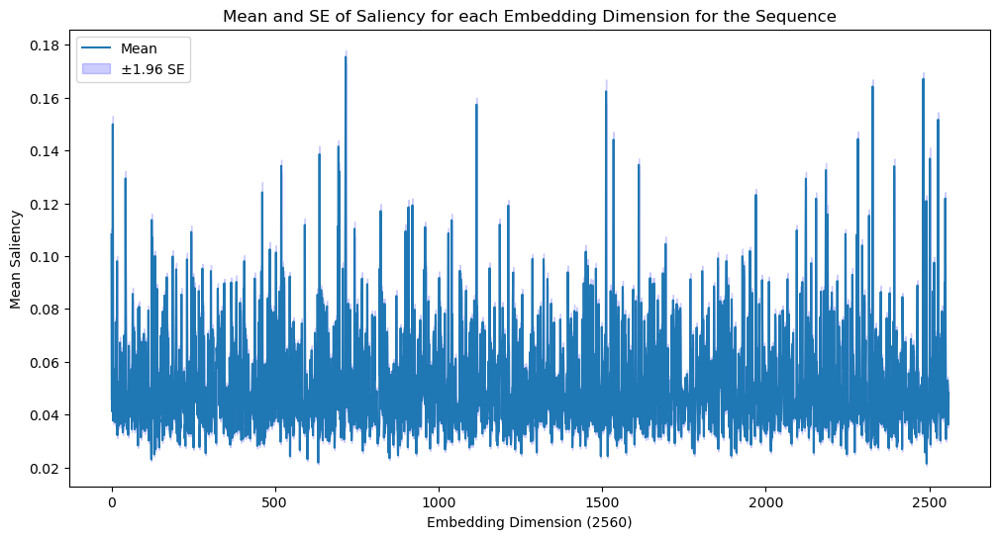

In [14]:
plot_mean_saliency_for_sequence(saliency_map, title="Mean and SE of Saliency for each Embedding Dimension for the Sequence")

In [15]:
saliency_map.shape

(122, 20, 2560)

In [16]:
saliency_slice = saliency_map[residue_index_zero_index]
# Number of top saliencies to retrieve
top_n = 4

# Flatten the 2D array into a 1D array
flat_indices = np.argsort(saliency_slice.ravel())[-top_n:][::-1]  # Get indices of top N values

# Convert flat indices back to 2D indices
mutant_indices, embedding_dims = np.unravel_index(flat_indices, saliency_slice.shape)

# Get top saliency values
top_saliency_values = saliency_slice[mutant_indices, embedding_dims]

# Print results
print(f"Top {top_n} highest saliencies for residue H48:")
for i in range(top_n):
    print(f"{i + 1}. Mutant {mutant_indices[i]}, Embedding Dimension {embedding_dims[i]} - Saliency: {top_saliency_values[i]:.4f}")

Top 4 highest saliencies for residue H48:
1. Mutant 12, Embedding Dimension 461 - Saliency: 0.3949
2. Mutant 5, Embedding Dimension 2502 - Saliency: 0.3806
3. Mutant 7, Embedding Dimension 1512 - Saliency: 0.3609
4. Mutant 9, Embedding Dimension 1512 - Saliency: 0.3514


In [17]:
highest_scoring_saliencies(saliency_map, residue_index_zero_index, n=5)

[('P', 461), ('G', 2502), ('I', 1512), ('L', 1512), ('V', 1512)]

## Mutation Effect vs. Mutant colored by AA Properties

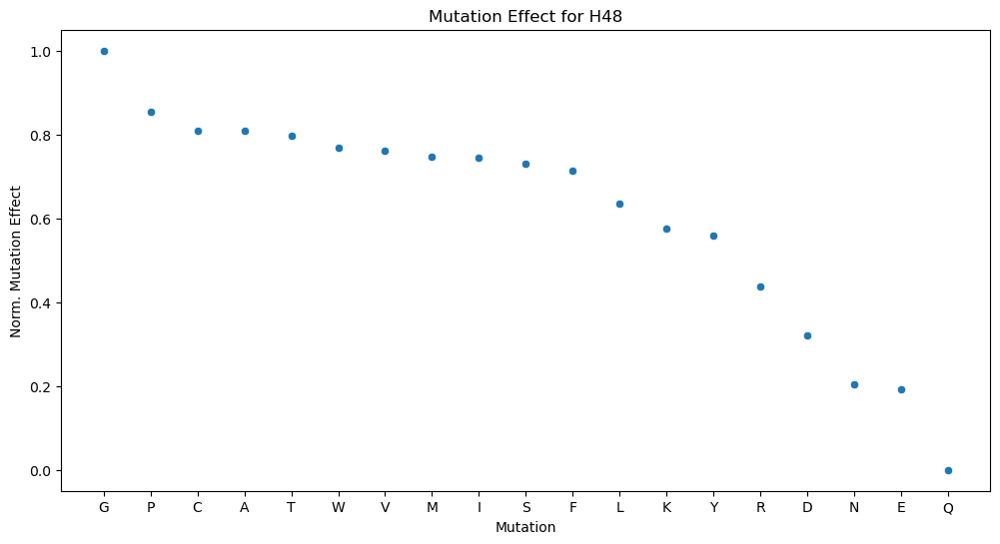

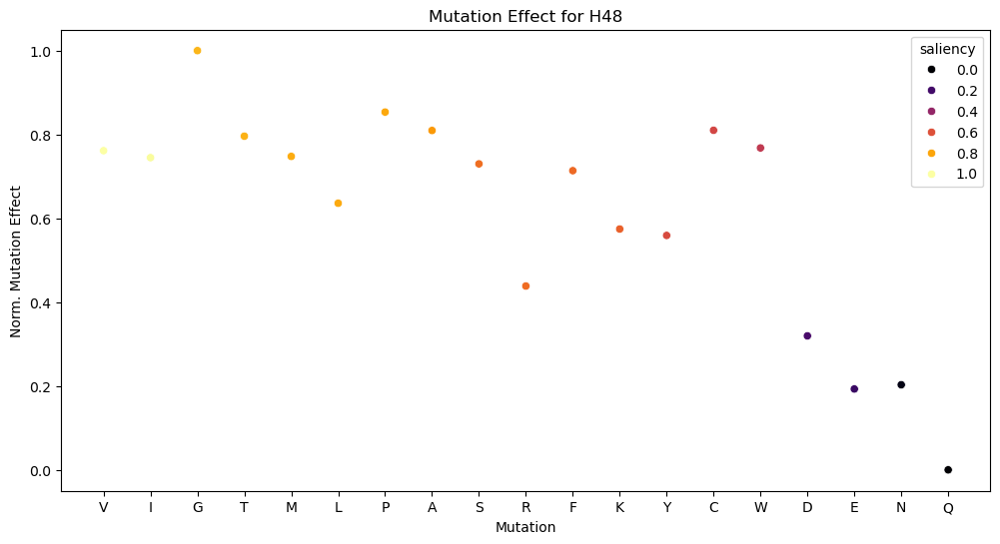

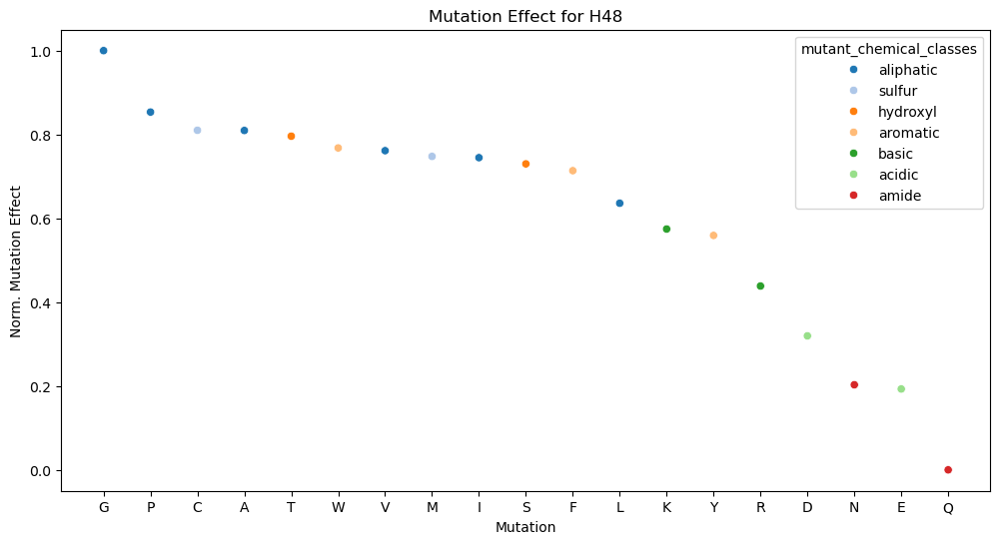

In [18]:
plot_mutation_effect_for_residue(mutation_effect_avg_saliency, residue_index_one_index, title="Mutation Effect for H48")
plot_mutation_effect_for_residue(mutation_effect_avg_saliency, residue_index_one_index, title="Mutation Effect for H48", color_by='saliency')
plot_mutation_effect_for_residue(mutation_effect_avg_saliency, residue_index_one_index, title="Mutation Effect for H48", color_by='mutant_chemical_classes')

mutant_hydropathy_classes


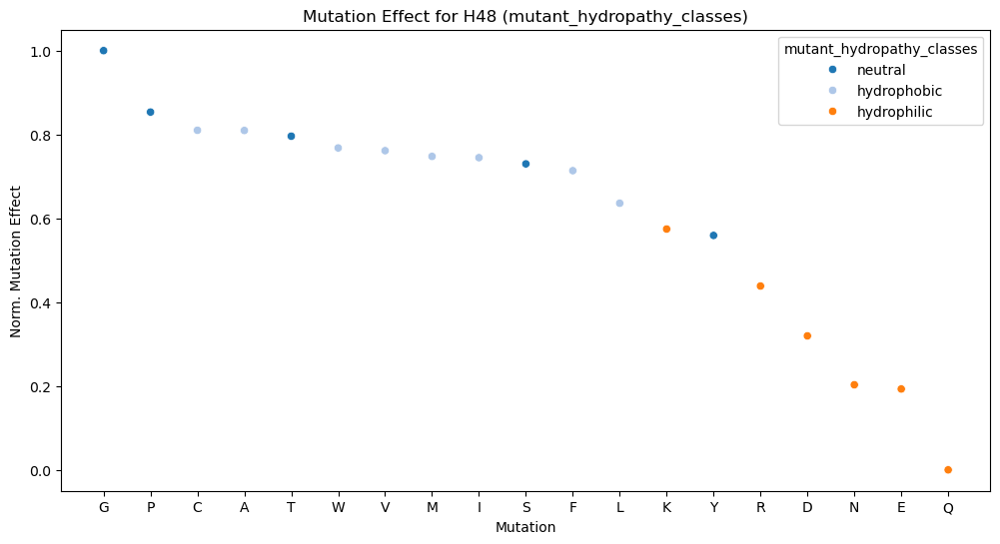

mutant_volume_classes


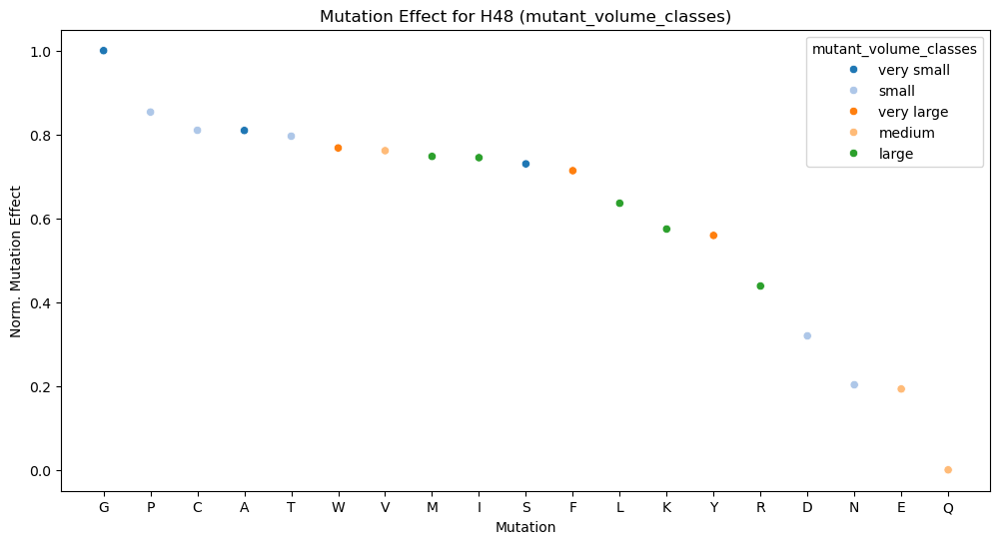

mutant_chemical_classes


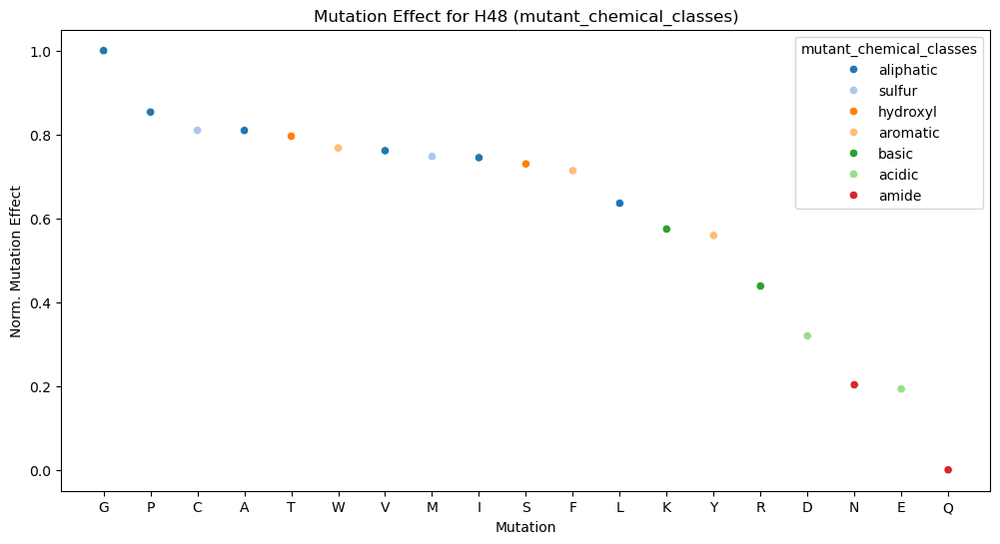

mutant_physicochemical_classes


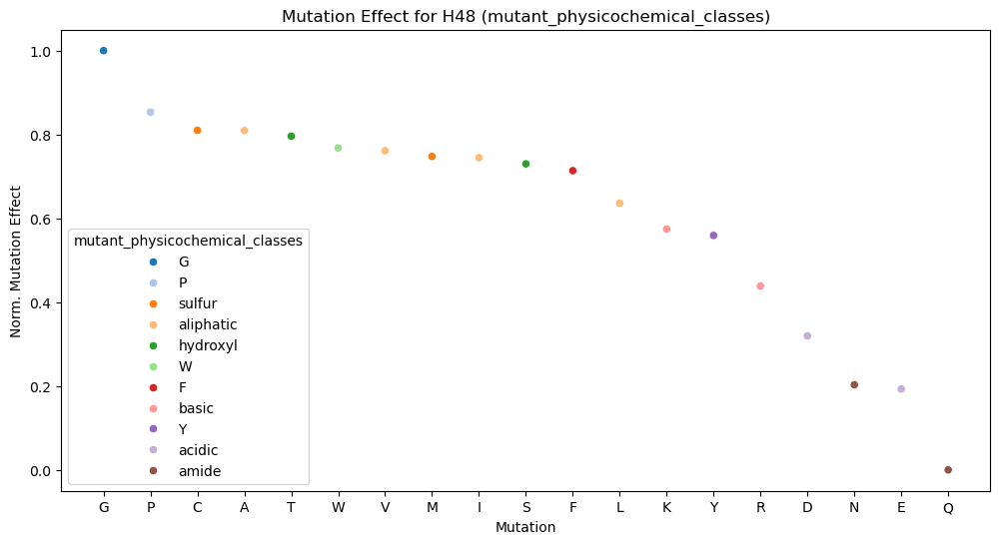

mutant_charge_classes


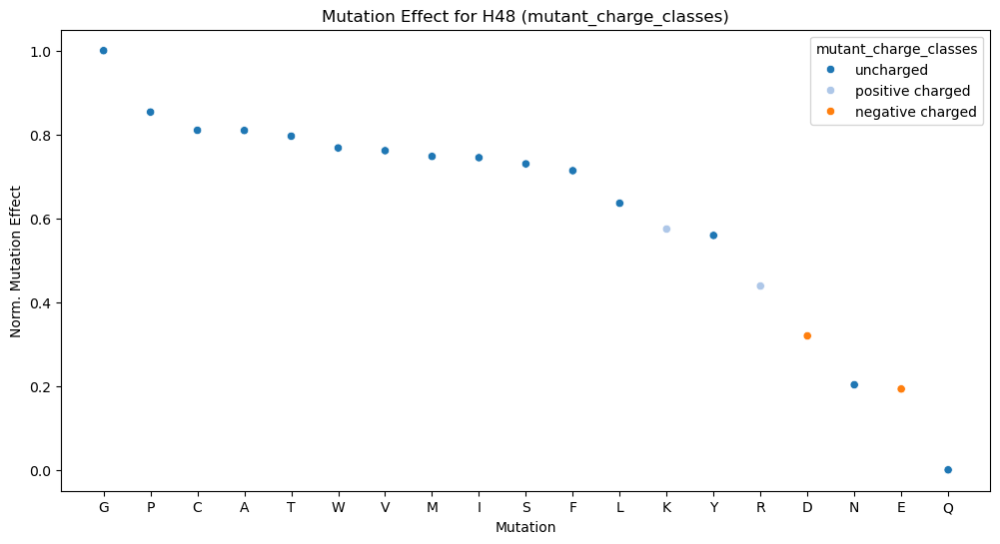

mutant_polarity_classes


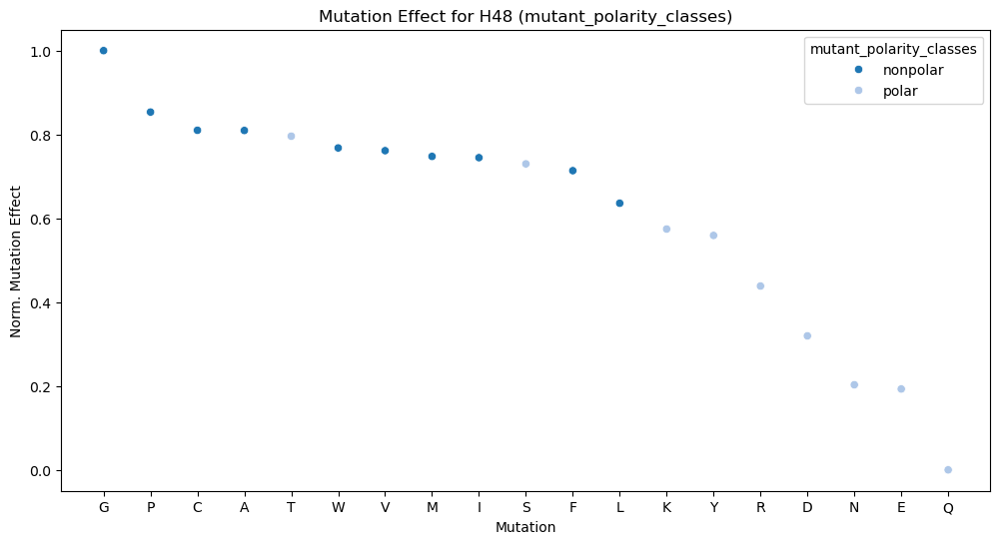

mutant_hydrogen_donor_acceptor_classes


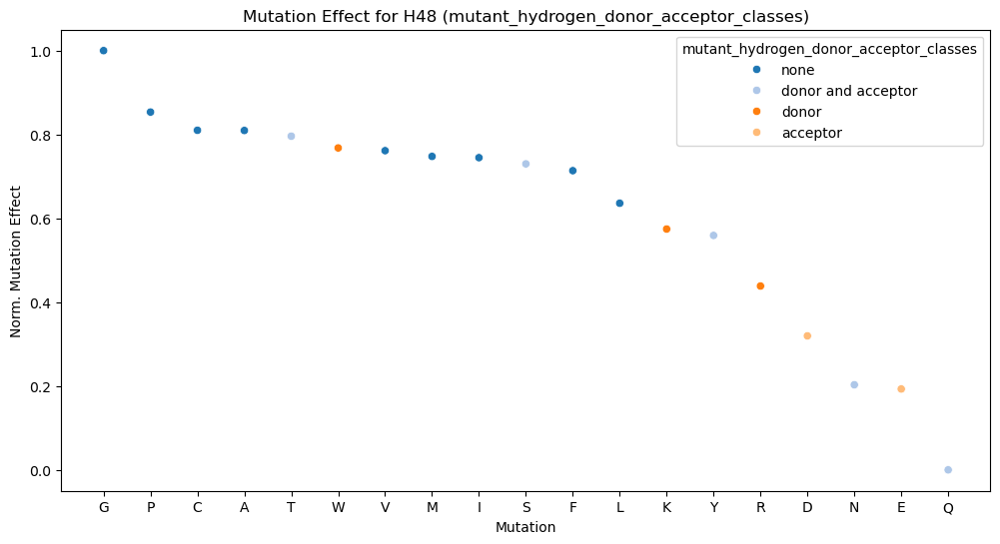

change_hydropathy_classes


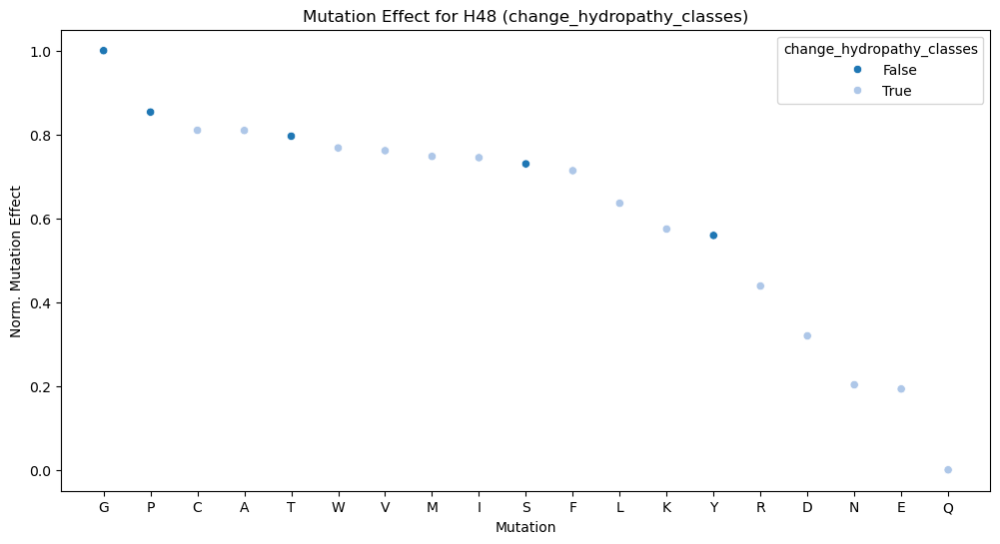

change_volume_classes


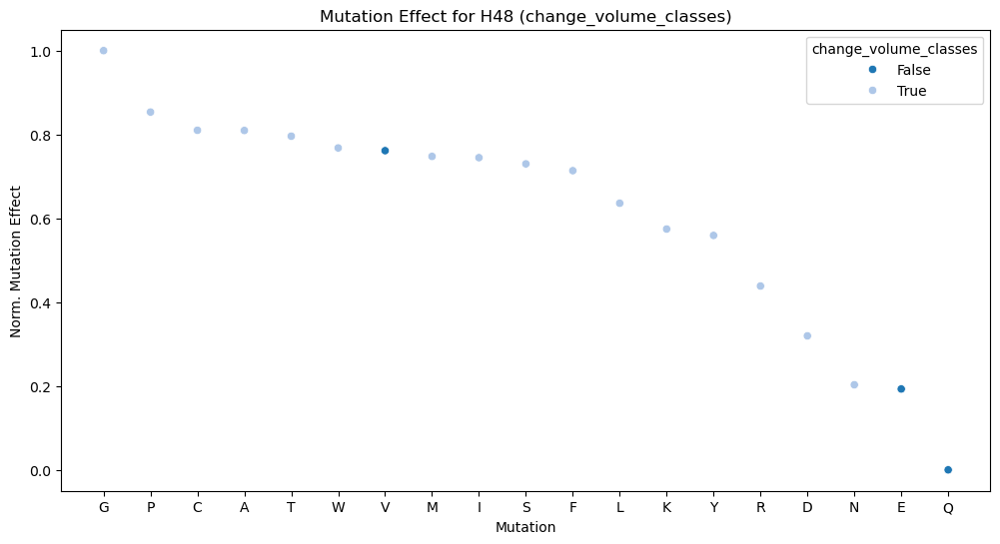

change_chemical_classes


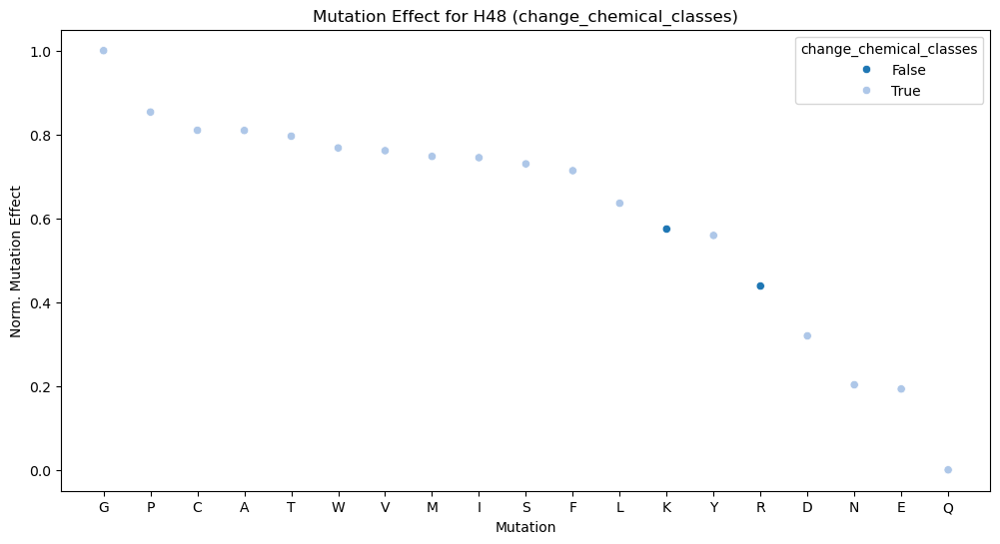

change_physicochemical_classes


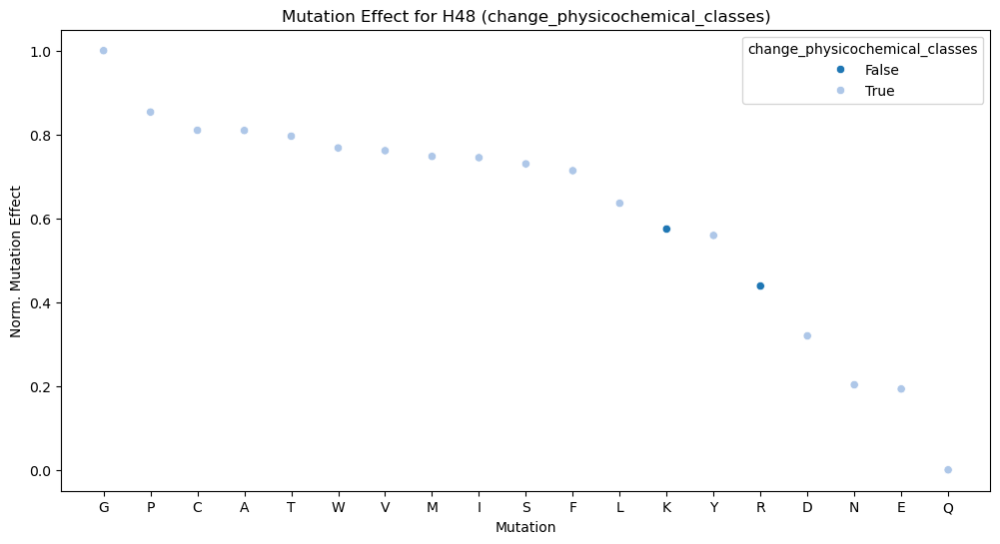

change_charge_classes


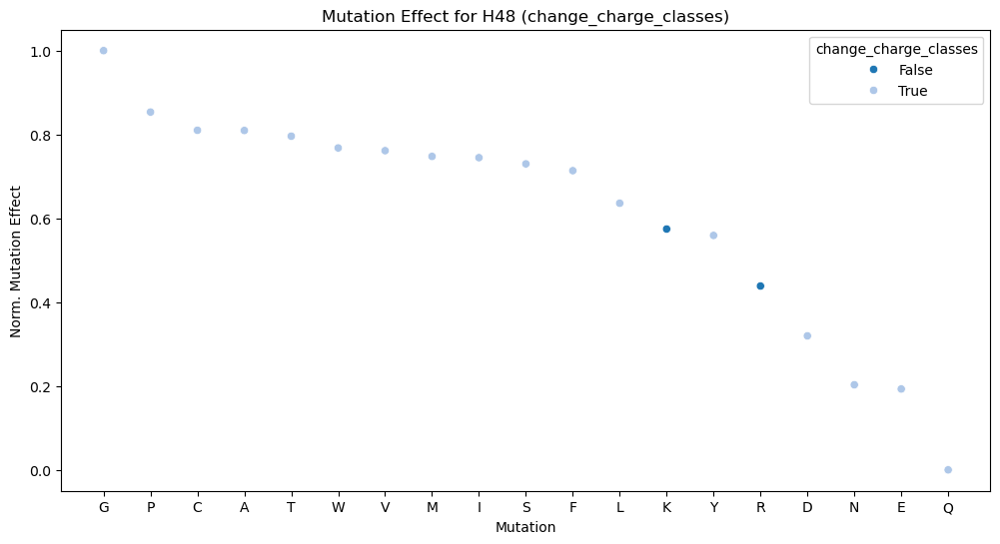

change_polarity_classes


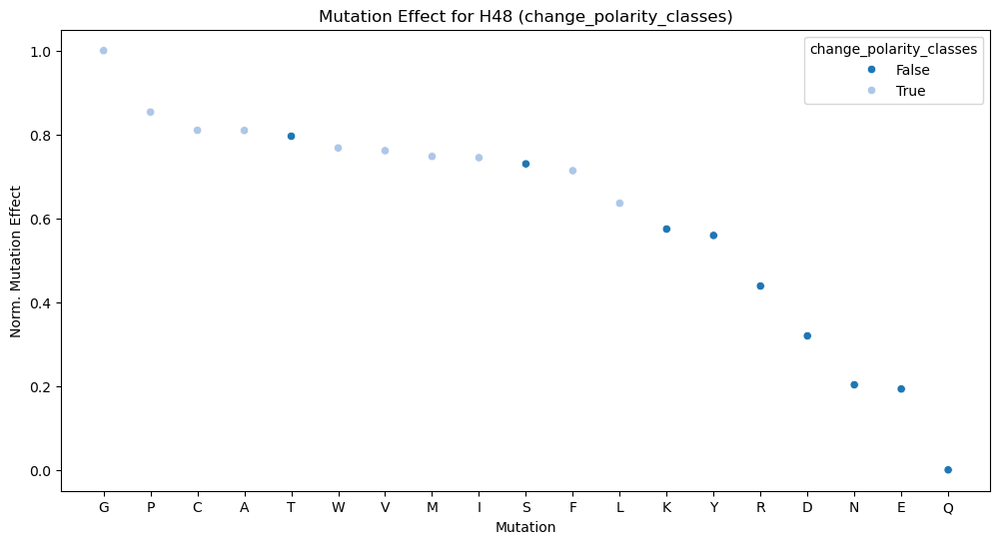

change_hydrogen_donor_acceptor_classes


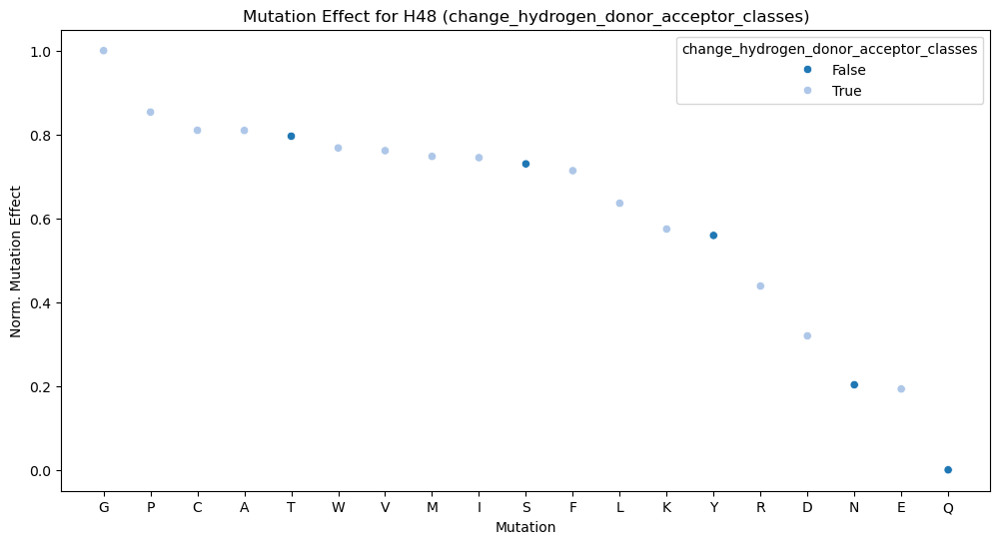

wildtype_hydropathy_classes


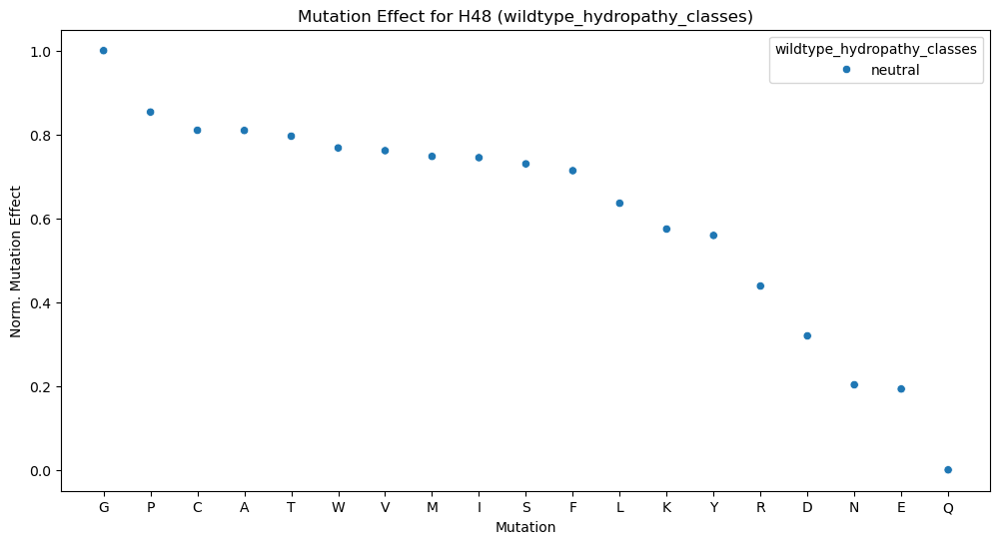

wildtype_volume_classes


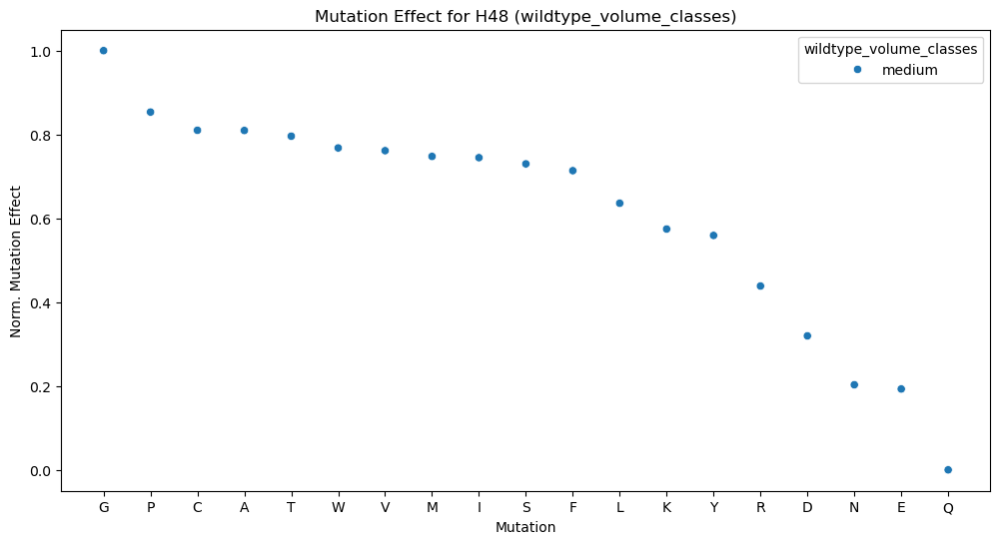

wildtype_chemical_classes


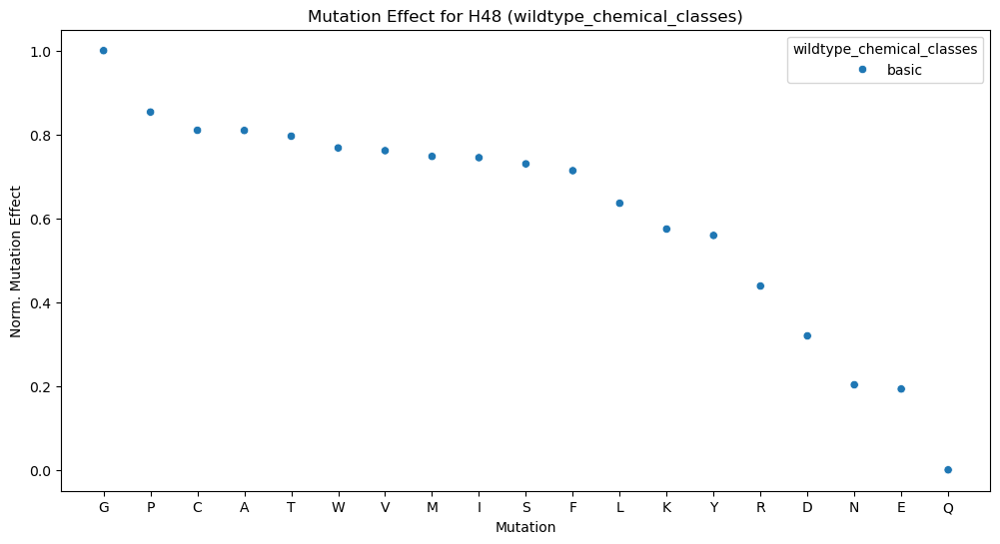

wildtype_physicochemical_classes


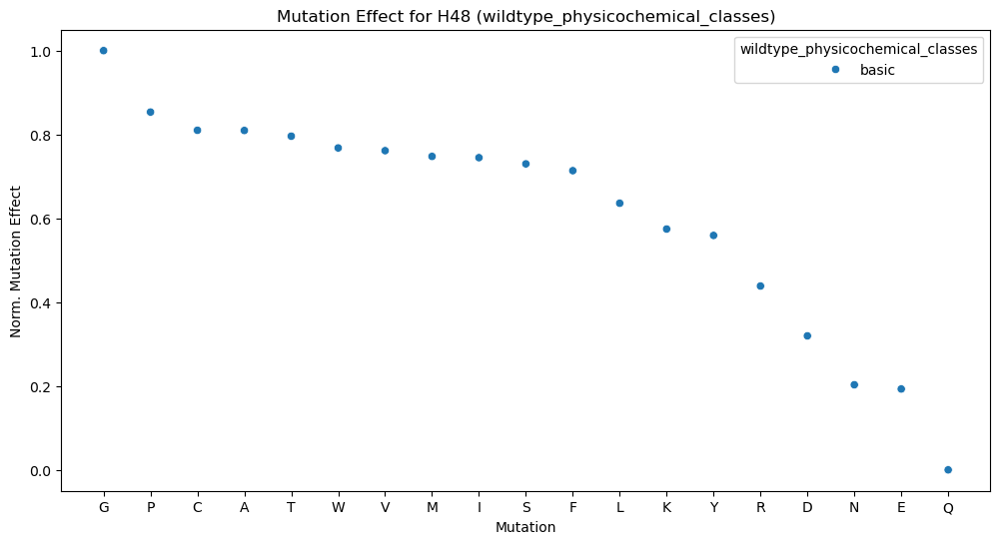

wildtype_charge_classes


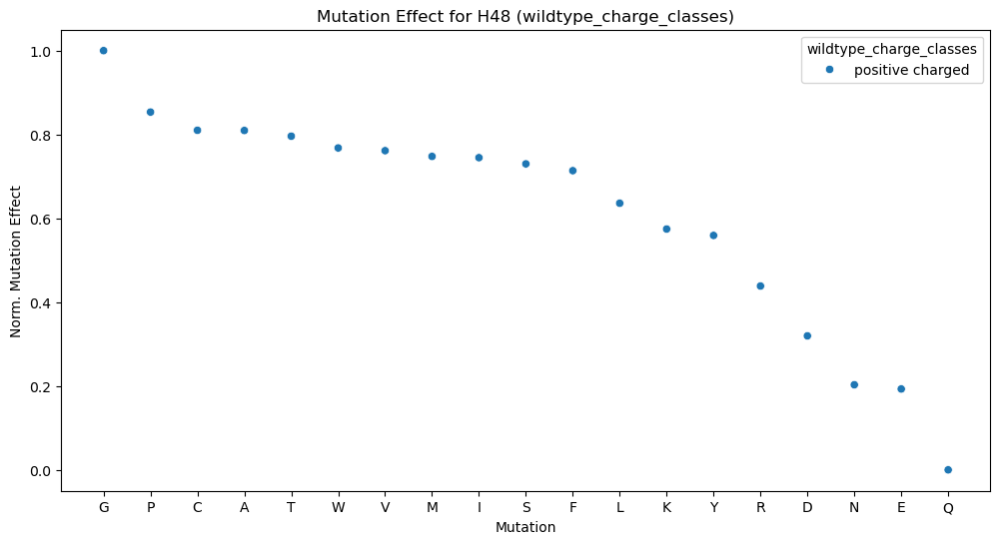

wildtype_polarity_classes


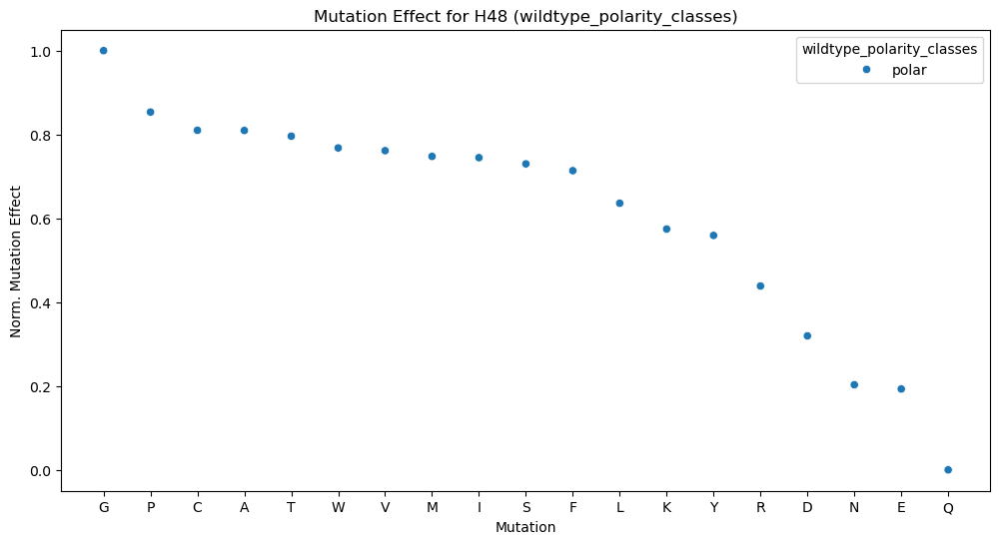

wildtype_hydrogen_donor_acceptor_classes


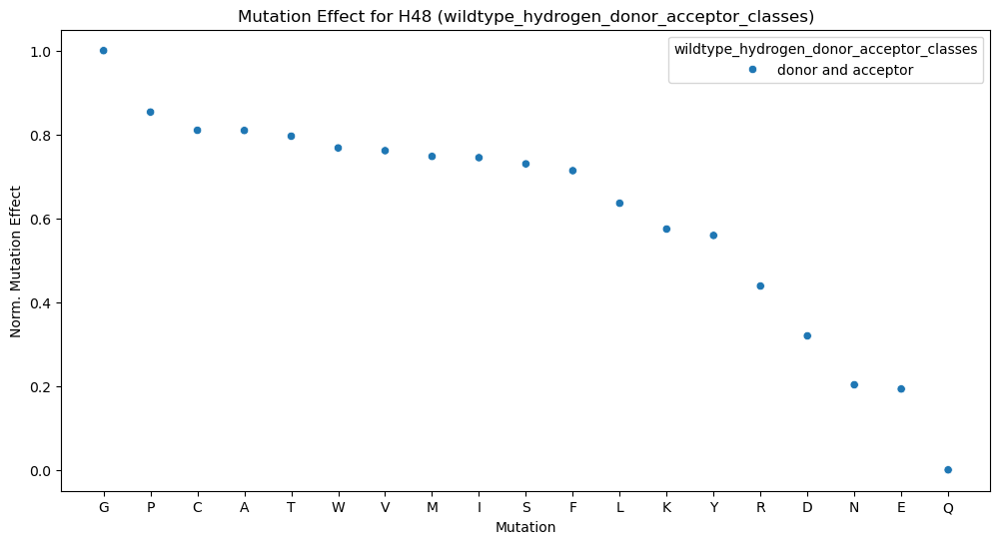

In [19]:
options = ['hydropathy_classes', 'volume_classes', 'chemical_classes', 'physicochemical_classes', 'charge_classes', 'polarity_classes', 'hydrogen_donor_acceptor_classes']
options = [f'mutant_{option}' for option in options] + [f'change_{option}' for option in options] + [f'wildtype_{option}' for option in options]
for option in options:
    print(option)
    plot_mutation_effect_for_residue(mutation_effect_avg_saliency, residue_index_one_index, title=f"Mutation Effect for H48 ({option})", color_by=option)

## Mutation Effect vs. Saliency colored by AA Properties 

In [20]:
from src.plotting import plot_interactive_mutant_effect_vs_saliency

In [30]:
plot_interactive_mutant_effect_vs_saliency(mutation_effect_avg_saliency, title="Mutation Effect vs Average Saliency")

for option in options + ['mutant', 'wildtype']:
    plot_interactive_mutant_effect_vs_saliency(mutation_effect_avg_saliency, title=f"Mutation Effect vs Average Saliency ({option})", color_by=option)

## Parallel Coordinates Plot

In [22]:
from src.plotting import plot_parallel_coordinates

In [31]:
plot_parallel_coordinates(mutation_effect_avg_saliency, columns_to_use=[
    'mutation_effect',
    'avg_saliency',
    'mutant_hydropathy_classes',
    'mutant_volume_classes',
    'mutant_chemical_classes',
    'mutant_physicochemical_classes',
    'mutant_charge_classes',
    'mutant_polarity_classes',
    'mutant_hydrogen_donor_acceptor_classes',
    'mutant'
    ],
    title="Parallel Coordinates Plot using aa properties of the Mutant"
)

Label Mapping:
mutant_hydropathy_classes: {0: 'hydrophilic', 1: 'hydrophobic', 2: 'neutral'}
mutant_volume_classes: {0: 'large', 1: 'medium', 2: 'small', 3: 'very large', 4: 'very small'}
mutant_chemical_classes: {0: 'acidic', 1: 'aliphatic', 2: 'amide', 3: 'aromatic', 4: 'basic', 5: 'hydroxyl', 6: 'sulfur'}
mutant_physicochemical_classes: {0: 'F', 1: 'G', 2: 'P', 3: 'W', 4: 'Y', 5: 'acidic', 6: 'aliphatic', 7: 'amide', 8: 'basic', 9: 'hydroxyl', 10: 'sulfur'}
mutant_charge_classes: {0: 'negative charged', 1: 'positive charged', 2: 'uncharged'}
mutant_polarity_classes: {0: 'nonpolar', 1: 'polar'}
mutant_hydrogen_donor_acceptor_classes: {0: 'acceptor', 1: 'donor', 2: 'donor and acceptor', 3: 'none'}
mutant: {0: 'A', 1: 'C', 2: 'D', 3: 'E', 4: 'F', 5: 'G', 6: 'H', 7: 'I', 8: 'K', 9: 'L', 10: 'M', 11: 'N', 12: 'P', 13: 'Q', 14: 'R', 15: 'S', 16: 'T', 17: 'V', 18: 'W', 19: 'Y'}


In [35]:
plot_parallel_coordinates(mutation_effect_avg_saliency, columns_to_use=[
    'mutation_effect',
    'avg_saliency',
    'mutant_hydropathy_classes',
    'mutant_volume_classes',
    'mutant_chemical_classes',
    'mutant_physicochemical_classes',
    'mutant_charge_classes',
    'mutant_polarity_classes',
    'mutant_hydrogen_donor_acceptor_classes',
    ],
    title="Parallel Coordinates Plot using aa properties of the Mutant"
)

Label Mapping:
mutant_hydropathy_classes: {0: 'hydrophilic', 1: 'hydrophobic', 2: 'neutral'}
mutant_volume_classes: {0: 'large', 1: 'medium', 2: 'small', 3: 'very large', 4: 'very small'}
mutant_chemical_classes: {0: 'acidic', 1: 'aliphatic', 2: 'amide', 3: 'aromatic', 4: 'basic', 5: 'hydroxyl', 6: 'sulfur'}
mutant_physicochemical_classes: {0: 'F', 1: 'G', 2: 'P', 3: 'W', 4: 'Y', 5: 'acidic', 6: 'aliphatic', 7: 'amide', 8: 'basic', 9: 'hydroxyl', 10: 'sulfur'}
mutant_charge_classes: {0: 'negative charged', 1: 'positive charged', 2: 'uncharged'}
mutant_polarity_classes: {0: 'nonpolar', 1: 'polar'}
mutant_hydrogen_donor_acceptor_classes: {0: 'acceptor', 1: 'donor', 2: 'donor and acceptor', 3: 'none'}


In [25]:
plot_parallel_coordinates(mutation_effect_avg_saliency, columns_to_use=[
    'mutation_effect',
    'avg_saliency',
    'wildtype_hydropathy_classes',
    'wildtype_volume_classes',
    'wildtype_chemical_classes',
    'wildtype_physicochemical_classes',
    'wildtype_charge_classes',
    'wildtype_polarity_classes',
    'wildtype_hydrogen_donor_acceptor_classes',
    'wildtype'
    ],
    title="Parallel Coordinates Plot using aa properties of the Wildtype"
)

Label Mapping:
wildtype_hydropathy_classes: {0: 'hydrophilic', 1: 'hydrophobic', 2: 'neutral'}
wildtype_volume_classes: {0: 'large', 1: 'medium', 2: 'small', 3: 'very large', 4: 'very small'}
wildtype_chemical_classes: {0: 'acidic', 1: 'aliphatic', 2: 'amide', 3: 'aromatic', 4: 'basic', 5: 'hydroxyl', 6: 'sulfur'}
wildtype_physicochemical_classes: {0: 'F', 1: 'G', 2: 'P', 3: 'W', 4: 'Y', 5: 'acidic', 6: 'aliphatic', 7: 'amide', 8: 'basic', 9: 'hydroxyl', 10: 'sulfur'}
wildtype_charge_classes: {0: 'negative charged', 1: 'positive charged', 2: 'uncharged'}
wildtype_polarity_classes: {0: 'nonpolar', 1: 'polar'}
wildtype_hydrogen_donor_acceptor_classes: {0: 'acceptor', 1: 'donor', 2: 'donor and acceptor', 3: 'none'}
wildtype: {0: 'A', 1: 'C', 2: 'D', 3: 'E', 4: 'F', 5: 'G', 6: 'H', 7: 'I', 8: 'K', 9: 'L', 10: 'M', 11: 'N', 12: 'P', 13: 'Q', 14: 'R', 15: 'S', 16: 'T', 17: 'V', 18: 'W', 19: 'Y'}


In [36]:
plot_parallel_coordinates(mutation_effect_avg_saliency, columns_to_use=[
    'mutation_effect',
    'avg_saliency',
    'wildtype_hydropathy_classes',
    'wildtype_volume_classes',
    'wildtype_chemical_classes',
    'wildtype_physicochemical_classes',
    'wildtype_charge_classes',
    'wildtype_polarity_classes',
    'wildtype_hydrogen_donor_acceptor_classes',
    ],
    title="Parallel Coordinates Plot using aa properties of the Wildtype"
)

Label Mapping:
wildtype_hydropathy_classes: {0: 'hydrophilic', 1: 'hydrophobic', 2: 'neutral'}
wildtype_volume_classes: {0: 'large', 1: 'medium', 2: 'small', 3: 'very large', 4: 'very small'}
wildtype_chemical_classes: {0: 'acidic', 1: 'aliphatic', 2: 'amide', 3: 'aromatic', 4: 'basic', 5: 'hydroxyl', 6: 'sulfur'}
wildtype_physicochemical_classes: {0: 'F', 1: 'G', 2: 'P', 3: 'W', 4: 'Y', 5: 'acidic', 6: 'aliphatic', 7: 'amide', 8: 'basic', 9: 'hydroxyl', 10: 'sulfur'}
wildtype_charge_classes: {0: 'negative charged', 1: 'positive charged', 2: 'uncharged'}
wildtype_polarity_classes: {0: 'nonpolar', 1: 'polar'}
wildtype_hydrogen_donor_acceptor_classes: {0: 'acceptor', 1: 'donor', 2: 'donor and acceptor', 3: 'none'}


In [33]:
plot_parallel_coordinates(mutation_effect_avg_saliency, columns_to_use=[
    'mutation_effect',
    'avg_saliency',
    'change_hydropathy_classes',
    'change_volume_classes',
    'change_chemical_classes',
    'change_physicochemical_classes',
    'change_charge_classes',
    'change_polarity_classes',
    'change_hydrogen_donor_acceptor_classes'
    ],
    title="Parallel Coordinates Plot using aa properties of the Wildtype"
)

Label Mapping:
change_hydropathy_classes: {0: False, 1: True}
change_volume_classes: {0: False, 1: True}
change_chemical_classes: {0: False, 1: True}
change_physicochemical_classes: {0: False, 1: True}
change_charge_classes: {0: False, 1: True}
change_polarity_classes: {0: False, 1: True}
change_hydrogen_donor_acceptor_classes: {0: False, 1: True}


## Boxplots and Violinplots

In [63]:
mutation_effect_avg_saliency[['mutation_effect', 'wildtype']].groupby('wildtype')

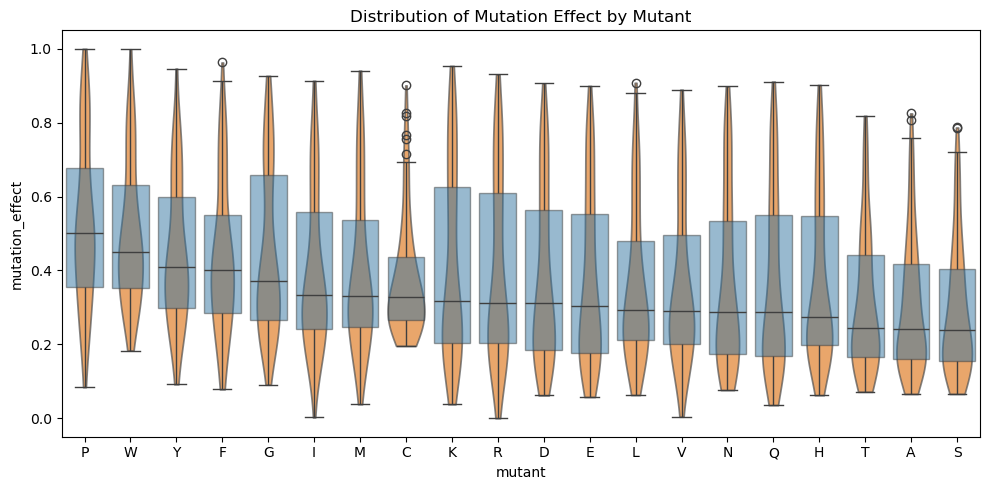

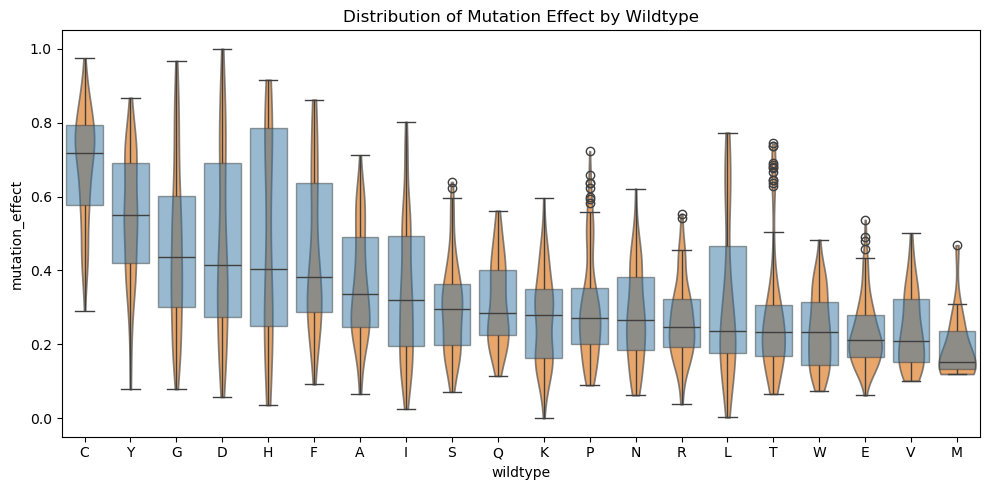

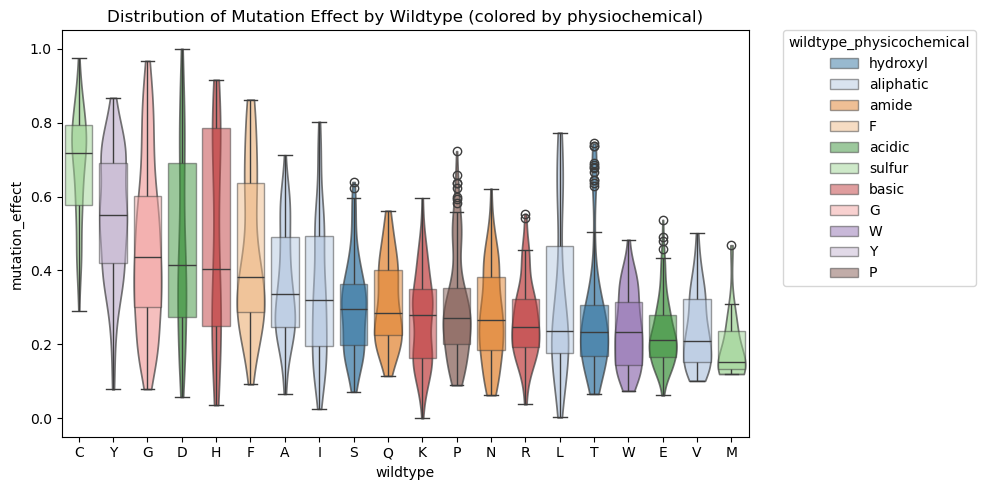

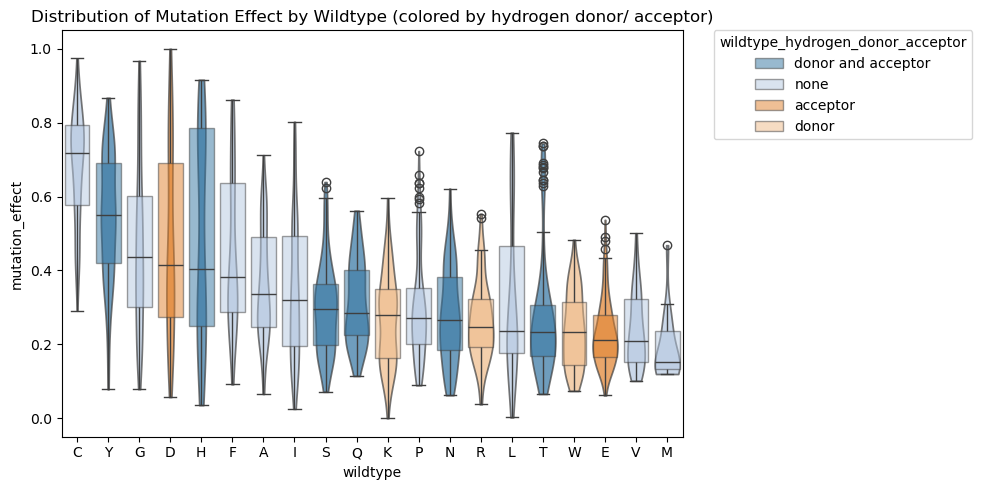

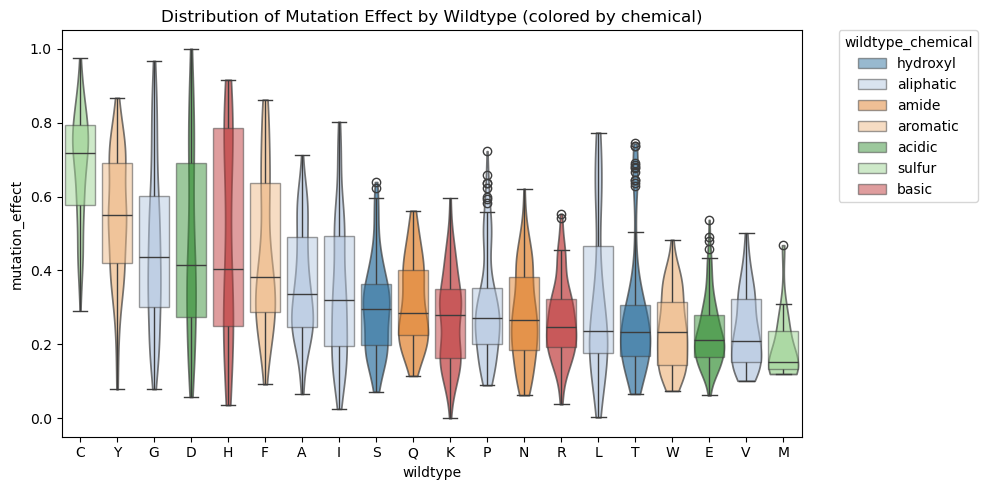

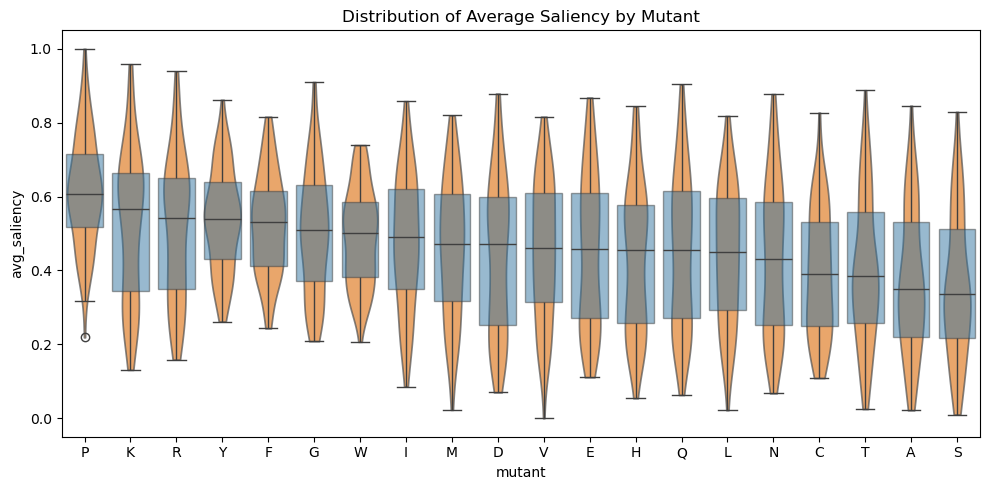

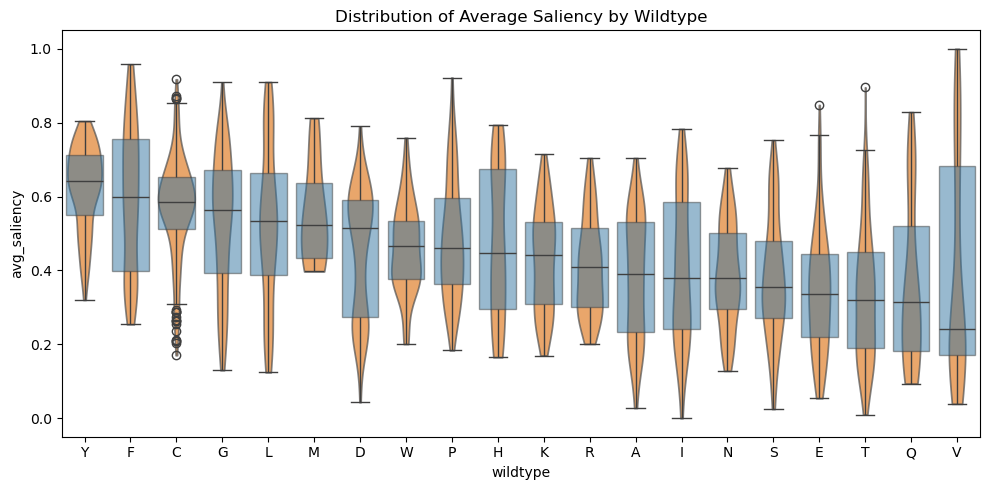

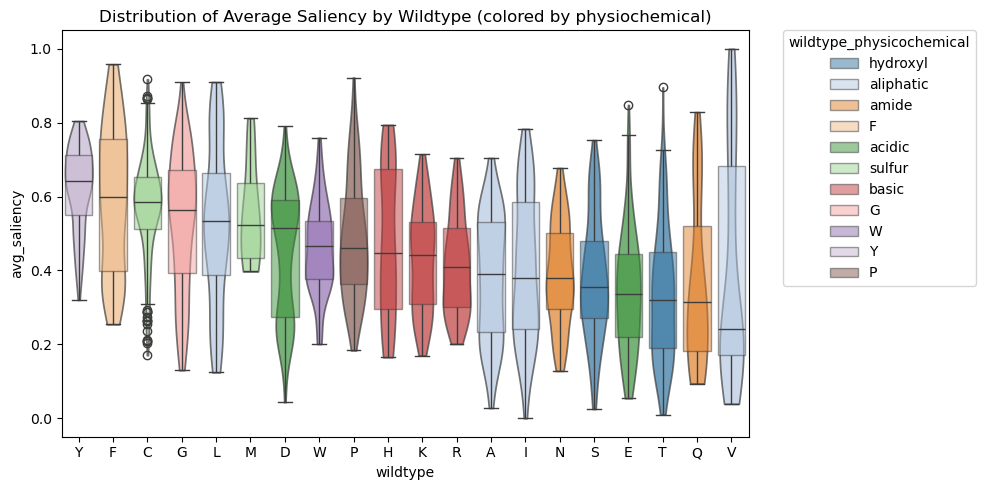

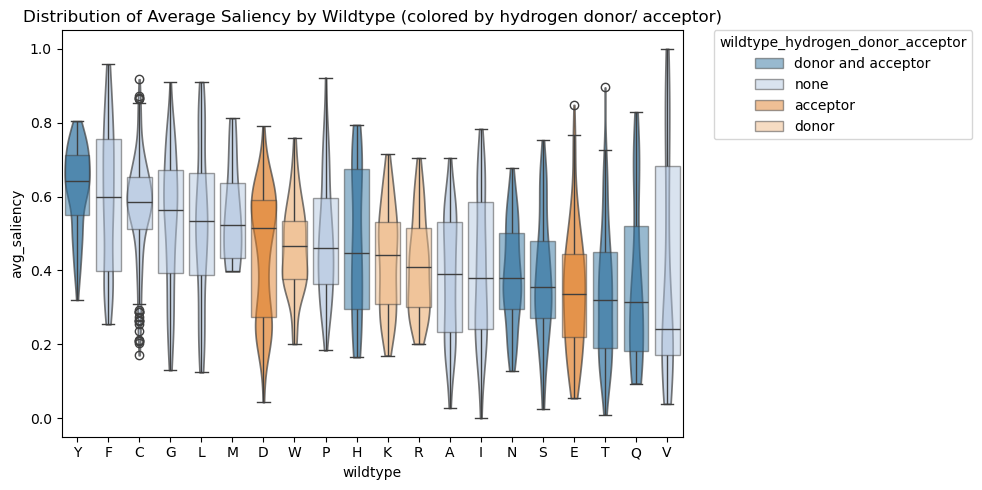

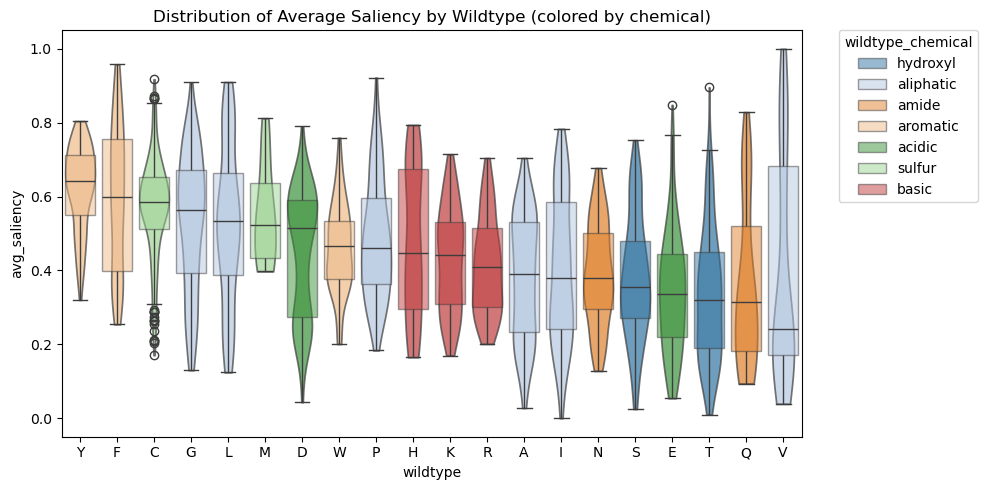

In [79]:
# mutation effect
plot_distribution(mutation_effect_avg_saliency, data_column='mutation_effect', label_column='mutant', title="Distribution of Mutation Effect by Mutant")
plot_distribution(mutation_effect_avg_saliency, data_column='mutation_effect', label_column='wildtype', title="Distribution of Mutation Effect by Wildtype")
# plot_distribution(mutation_effect_avg_saliency, data_column='mutation_effect', label_column='wildtype', title="Distribution of Mutation Effect by Wildtype (colored by Wildtype)", color_by='wildtype')
plot_distribution(mutation_effect_avg_saliency, data_column='mutation_effect', label_column='wildtype', title="Distribution of Mutation Effect by Wildtype (colored by physiochemical)", color_by='wildtype_physicochemical_classes')
plot_distribution(mutation_effect_avg_saliency, data_column='mutation_effect', label_column='wildtype', title="Distribution of Mutation Effect by Wildtype (colored by hydrogen donor/ acceptor)", color_by='wildtype_hydrogen_donor_acceptor_classes')
plot_distribution(mutation_effect_avg_saliency, data_column='mutation_effect', label_column='wildtype', title="Distribution of Mutation Effect by Wildtype (colored by chemical)", color_by='wildtype_chemical_classes')

# saliency 
plot_distribution(mutation_effect_avg_saliency, data_column='avg_saliency', label_column='mutant', title="Distribution of Average Saliency by Mutant")
plot_distribution(mutation_effect_avg_saliency, data_column='avg_saliency', label_column='wildtype', title="Distribution of Average Saliency by Wildtype")
# plot_distribution(mutation_effect_avg_saliency, data_column='avg_saliency', label_column='wildtype', title="Distribution of Average Saliency by Wildtype (colored by Wildtype)", color_by='wildtype')
plot_distribution(mutation_effect_avg_saliency, data_column='avg_saliency', label_column='wildtype', title="Distribution of Average Saliency by Wildtype (colored by physiochemical)", color_by='wildtype_physicochemical_classes')
plot_distribution(mutation_effect_avg_saliency, data_column='avg_saliency', label_column='wildtype', title="Distribution of Average Saliency by Wildtype (colored by hydrogen donor/ acceptor)", color_by='wildtype_hydrogen_donor_acceptor_classes')
plot_distribution(mutation_effect_avg_saliency, data_column='avg_saliency', label_column='wildtype', title="Distribution of Average Saliency by Wildtype (colored by chemical)", color_by='wildtype_chemical_classes')
